In [1]:
from utils import data_preparation, data_visualisation

%load_ext autoreload
%autoreload 2

# Create DF 

In [2]:
path = 'data/ride.tcx'
df = data_preparation.create_df(path)
df.head(3)

,Time,Latitude,Longitude,Altitude (M),Total Distance (M),Total Distance (KM)
0,2023-09-22T22:41:40+00:00,37.998980,-1.13315,46.02,0.000000,0.000000
1,2023-09-22T22:41:49+00:00,37.998233,-1.13288,45.98,86.408879,0.086409
2,2023-09-22T22:41:59+00:00,37.997487,-1.13261,45.68,172.817758,0.172818


# Prepare DF

In [3]:
data_preparation.prepare_df(df)
df.head(3)

,Time,Latitude,Longitude,Altitude (M),Total Distance (M),Total Distance (KM),Time Difference,Altitude Difference,Segment Speed,Total Time (M)
0,2023-09-22 22:41:40+00:00,37.998980,-1.13315,46.02,0.000000,0.000000,NaT,NaN,NaN,NaN
1,2023-09-22 22:41:49+00:00,37.998233,-1.13288,45.98,86.408879,0.086409,0 days 00:00:09,-0.04,34.563552,0.150000
2,2023-09-22 22:41:59+00:00,37.997487,-1.13261,45.68,172.817758,0.172818,0 days 00:00:10,-0.30,31.107196,0.316667


In [4]:
data_preparation.basic_info(df)

The total distance is 84.79 Km.
------------------------------------------------------
The total moving time is 0 days 04:04:31.
------------------------------------------------------
The total ascent was 476.24 Metres.
The total descent was -519.77 Metres.
The total change was -43.53 Metres.
------------------------------------------------------
The lowest altitude was 2.49 Metres.
The highest altitude was 248.85 Metres.
------------------------------------------------------
The average speed was 20.81 Km/h.
The fastest speed was 39.98 Km/h.
The slowest speed was 1.13 Km/h.


# Visualise

## Speed

In [5]:
data_visualisation.distance_speed_graph(df)

In [7]:
data_visualisation.time_speed_graph(df)

## Distance


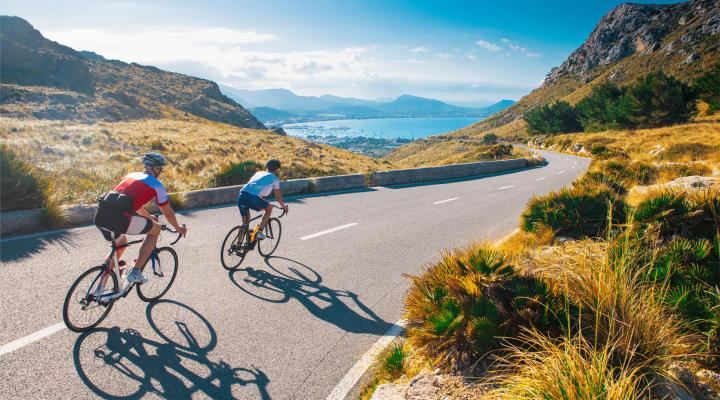

In [8]:
data_visualisation.create_time_distance_graph(df)

## Altitude


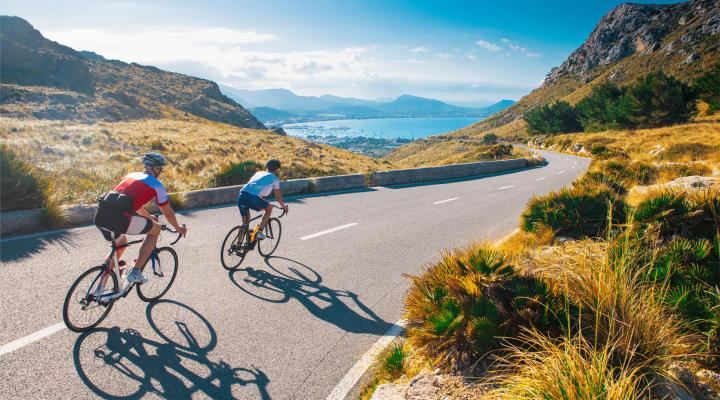

In [9]:
data_visualisation.altitude_distance_graph(df)

## Map

In [10]:
data_visualisation.plot_line_map(df)

## Altitude, Time, Speed

In [11]:
data_visualisation.altitude_time_speed_graph(df)

## Altitude, Distance, Speed

In [12]:
data_visualisation.altitude_distance_speed_graph(df)

# TESTS

In [13]:
import plotly.express as px
import pandas as pd


# Create a 3D scatter plot with altitude as the z-coordinate and color based on speed
fig = px.scatter_3d(df, x='Longitude', y='Latitude', z='Altitude (M)',
                    color='Segment Speed', color_continuous_scale='Viridis')

# Customize the appearance
fig.update_layout(scene=dict(xaxis_title='Longitude', yaxis_title='Latitude', zaxis_title='Altitude (M)'))
fig.update_coloraxes(colorbar_title='Speed (m/s)')

# Show the plot
fig.show()

In [14]:
import plotly.graph_objects as go
import pandas as pd

# Create a custom 3D line chart with a color scale
fig = go.Figure()

# Define a color scale using a Plotly palette (e.g., 'Viridis')
color_scale = 'Viridis'

# Iterate through each data point
for index, row in df.iterrows():
    x = [row['Longitude'], row['Longitude']]  # x-coordinates for the line segment
    y = [row['Latitude'], row['Latitude']]    # y-coordinates for the line segment
    z = [0, row['Altitude (M)']]              # z-coordinates for the line segment (start at 0 altitude)

    # Add the line segment to the figure with a color based on 'Segment Speed'
    fig.add_trace(go.Scatter3d(
        x=x, y=y, z=z, 
        mode='lines', 
        line=dict(
            width=2, color=row['Segment Speed'], colorscale=color_scale
        ),
        showlegend=False,
    ))

# Customize the appearance
fig.update_layout(scene=dict(xaxis_title='Longitude', yaxis_title='Latitude', zaxis_title='Altitude (M)'))

# Add a color scale
fig.update_traces(marker=dict(size=4, colorbar=dict(title='Speed (m/s)')), selector=dict(mode='markers'))

# Show the plot
fig.show()


In [15]:
import plotly.express as px
import pandas as pd

def altitude_time_speed_graph(df):
    fig = px.scatter(df, x='Total Time (M)', y='Altitude (M)', color='Segment Speed', color_continuous_scale='Viridis',
                     hover_data=['Altitude (M)'], labels={'Altitude (M)': 'Altitude (m)'}, title='2D Scatter Plot with Gradient Line')

    fig.add_trace(px.line(df, x='Total Time (M)', y='Altitude (M)', color='Altitude (M)').data[0])

    fig.update_traces(line=dict(width=4), hovertemplate='Total Time (M): %{y:.1f}<br>Altitude (M): %{y:.1f}<br>Segment Speed (Km/h): %{marker.color:.2f}<extra></extra>')
    fig.update_coloraxes(colorbar_title='Speed (m/s)')

    return fig.show()


In [16]:
import plotly.express as px
import plotly.graph_objects as go

def altitude_time_speed_3d_graph(df):
    fig = go.Figure()

    # Add 3D scatter points
    scatter_trace = go.Scatter3d(
        x=df['Latitude'],
        y=df['Longitude'],
        z=df['Altitude (M)'],
        mode='markers',
        marker=dict(
            size=5,
            color=df['Segment Speed'],
            colorscale='Viridis',
            colorbar=dict(title='Speed (m/s)')
        ),
        text=df['Altitude (M)'],
        name='Altitude (M)'
    )
    fig.add_trace(scatter_trace)

    # Extract marker colors
    marker_colors = scatter_trace.marker.color
    print(marker_colors[10])

    # Create lines connecting each point to y=0 with the same color as the marker
    for i, row in df.iterrows():
        line_color = marker_colors[i]
        fig.add_trace(go.Scatter3d(
            x=[row['Latitude'], row['Latitude']],
            y=[row['Longitude'], row['Longitude']],
            z=[row['Altitude (M)'], 0],
            mode='lines',
            line=dict(width=4, color=line_color),
            hoverinfo='skip',
            showlegend=False
        ))

    # Set axis labels and title
    fig.update_layout(
        scene=dict(
            xaxis_title='Latitude',
            yaxis_title='Longitude',
            zaxis_title='Altitude (M)'
        ),
        title='3D Scatter Plot with Lines to y=0 Plane'
    )

    return fig.show()


In [17]:
altitude_time_speed_3d_graph(df)

5.2078965442845515
